# XAI - Explainable Deep Learning - Alejandro Paredes

[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AlejandroParedesLT/deep_learning_explanations/blob/main/grad_cam_deep_learning.ipynb)


In [19]:
!pip install --upgrade grad-cam

# GradCam exploration


## Semantic segmentation for traffic sematic segmentation, focusing on pedestrian identification

In order to evaluate the model's performance to a custom model for semantic segmentation a solution for this dataset is provided.

@inproceedings{zhou2017scene,
    title={Scene Parsing through ADE20K Dataset},
    author={Zhou, Bolei and Zhao, Hang and Puig, Xavier and Fidler, Sanja and Barriuso, Adela and Torralba, Antonio},
    booktitle={Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition},
    year={2017}
}

@article{zhou2016semantic,
  title={Semantic understanding of scenes through the ade20k dataset},
  author={Zhou, Bolei and Zhao, Hang and Puig, Xavier and Fidler, Sanja and Barriuso, Adela and Torralba, Antonio},
  journal={arXiv preprint arXiv:1608.05442},
  year={2016}
}


Model reference:

https://modelzoo.co/model/semantic-segmentation-pytorch-2


Specifications:

https://github.com/CSAILVision/sceneparsing

In [20]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD


In [21]:
# Import utility functions and colors

# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]


# metadata

import requests

url_labels = "https://raw.githubusercontent.com/CSAILVision/sceneparsing/refs/heads/master/objectInfo150.txt"
r = requests.get(url_labels)
r.raise_for_status()

with open("objectInfo150.txt", "wb") as f:
    f.write(r.content)

print("File downloaded successfully!")


def load_ade20k_classes(filepath="objectInfo150.txt"):
    class_map = {}
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith("#"):
                continue
            parts = line.split()
            try:
                idx = int(parts[0])
                name = parts[4]
                class_map[idx] = name
            except (ValueError, IndexError):
                continue
    return class_map

# Load again
class_map = load_ade20k_classes()
print(f"Loaded {len(class_map)} ADE20K classes.")
print({k: class_map[k] for k in range(1, 6)})  # preview first 5


from PIL import ImageDraw, ImageFont
import numpy as np
import PIL

def visualize_result(img, pred, index=None, class_map=class_map):
    """
    img: HxWx3 numpy array (original image)
    pred: HxW numpy array (predicted class indices, 0-based)
    index: optional int, filter to a single class (0-based)
    class_map: dict, maps ADE20K class index (1-based) -> name
    """
    # Filter prediction if requested
    pred_to_show = pred.copy()
    if index is not None:
        pred_to_show[pred_to_show != index] = -1

    # Colorize prediction
    pred_color = colorEncode(pred_to_show, colors).astype(np.uint8)

    # Overlay labels directly on the **segmentation mask**, not the concatenated image
    im_vis = pred_color.copy()
    im_vis_pil = PIL.Image.fromarray(im_vis)
    draw = ImageDraw.Draw(im_vis_pil)
    font_size = max(12, img.shape[1] // 50)
    try:
        font = ImageFont.truetype("arial.ttf", font_size)
    except:
        font = ImageFont.load_default()

    # For each class, find centroid of all pixels and draw label
    unique_classes = np.unique(pred_to_show)
    for cls_idx in unique_classes:
        if cls_idx < 0:
            continue
        mask = (pred_to_show == cls_idx)
        if np.sum(mask) == 0:
            continue

        # Centroid of all pixels of this class
        ys, xs = np.where(mask)
        y0, x0 = int(np.mean(ys)), int(np.mean(xs))
        cls_name = class_map.get(cls_idx + 1, str(cls_idx)) if class_map else str(cls_idx)

        # Draw label
        draw.text((x0, y0), cls_name, fill=(255, 255, 255), font=font)

    # Combine original image + segmentation mask side by side
    im_vis_full = np.concatenate((img, np.array(im_vis_pil)), axis=1)
    display(PIL.Image.fromarray(im_vis_full))


File downloaded successfully!
Loaded 150 ADE20K classes.
{1: 'wall', 2: 'building,', 3: 'sky', 4: 'floor,', 5: 'tree'}


In [22]:
class_map[13]

'person,'

In [23]:
# Segmentation model builder
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [24]:
!nvidia-smi

Mon Oct  6 03:33:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   77C    P0             35W /   70W |    2460MiB /  15360MiB |      6%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

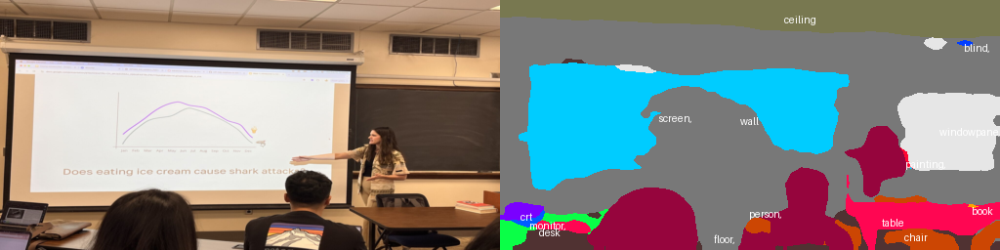

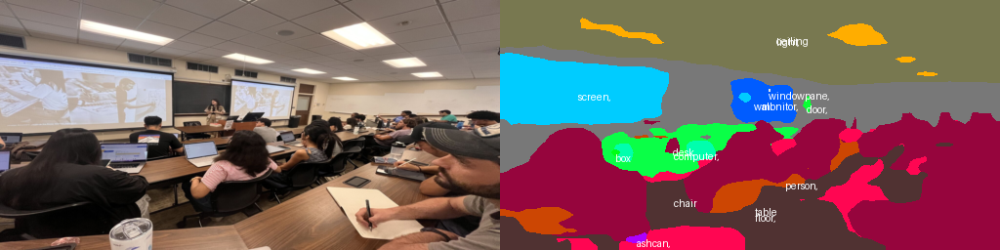

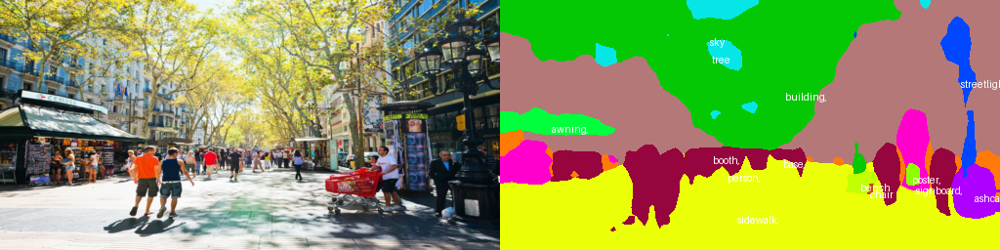

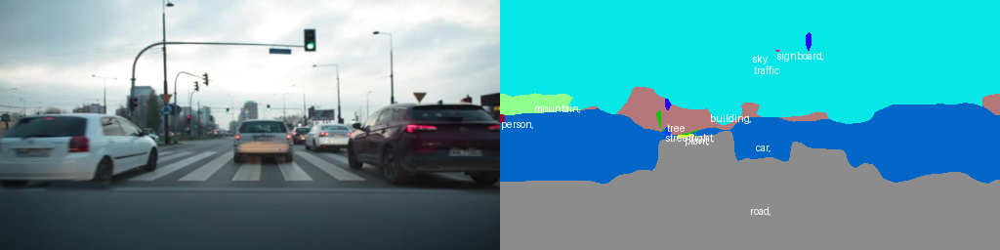

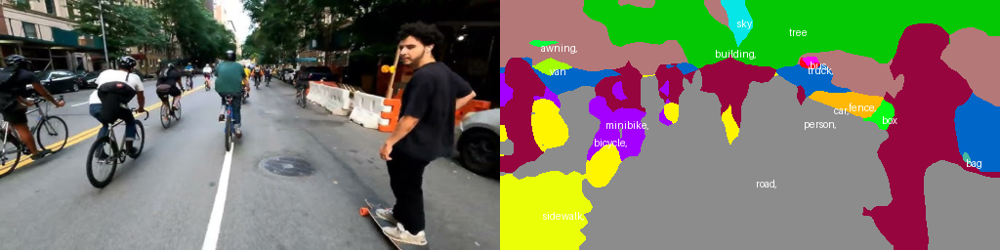

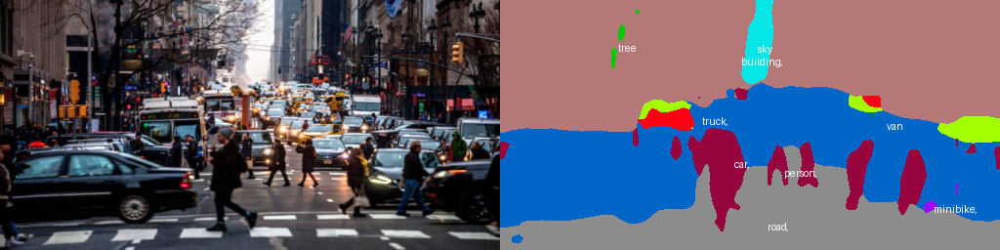

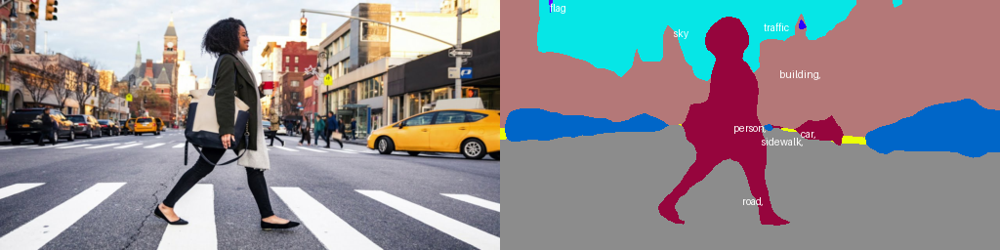

In [25]:
import torch
import gc
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])

# Load duke scenes and predict instances of the semantic segmentation task
import requests
from PIL import Image
from io import BytesIO

url_collections = [
  'https://media.licdn.com/dms/image/v2/D4E22AQFM-fz1zsUw1g/feedshare-shrink_2048_1536/feedshare-shrink_2048_1536/0/1724961258219?e=1762387200&v=beta&t=51lf-3asFThp03GqryGa2762RC5YMpB6noOC5a6mLzo'
  ,'https://media.licdn.com/dms/image/v2/D4E22AQFIO-6Ny9CUvg/feedshare-shrink_2048_1536/feedshare-shrink_2048_1536/0/1724961258512?e=1762387200&v=beta&t=zJKnScBe3XDFvZtak660hm7l6R5EABQBne5Bp9pcCRQ'
  ,'https://d36tnp772eyphs.cloudfront.net/blogs/1/2020/06/Barcelona.jpg'
  ,'https://t4.ftcdn.net/jpg/03/04/56/15/360_F_304561508_Pzpf4LHSJGbhJJNz8zyGd4qqygUa3VvI.jpg'
  ,'https://i.ytimg.com/vi/df-wgtdL2lk/hq720.jpg?sqp=-oaymwE7CK4FEIIDSFryq4qpAy0IARUAAAAAGAElAADIQj0AgKJD8AEB-AH-CYAC0AWKAgwIABABGGUgZShlMA8=&rs=AOn4CLAogCujr1s7c-uPSmukTtqpB_WD3A'
  ,'https://media.istockphoto.com/id/1138722351/photo/new-york-city-traffic.jpg?s=612x612&w=0&k=20&c=rzMKl7NWbEOZ2ktBAD8Oaj74aqli4s8chHPSZd4cCNM='
  ,'https://i.ytimg.com/vi/6GXdV1-589E/maxresdefault.jpg'
]
for url in url_collections:
  response = requests.get(url, timeout=10)
  response.raise_for_status()  # ensures request was successful

  pil_image = Image.open(BytesIO(response.content)).convert('RGB')

  pil_image = pil_image.resize((512,256), resample=Image.BILINEAR)
  # pil_image = PIL.Image.open().convert('RGB')
  img_original = numpy.array(pil_image)
  img_data = pil_to_tensor(pil_image)
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]
  # Run the segmentation at the highest resolution.
  with torch.no_grad():
      scores = segmentation_module(singleton_batch, segSize=output_size)

  # Get the predicted scores for each pixel
  _, pred = torch.max(scores, dim=1)
  # print(pred)
  pred = pred.cpu()[0].numpy()
  visualize_result(img_original, pred, index=None, class_map=class_map)
  del singleton_batch, scores, img_data
  torch.cuda.empty_cache()   # release cached memory
  gc.collect()


### Only the people

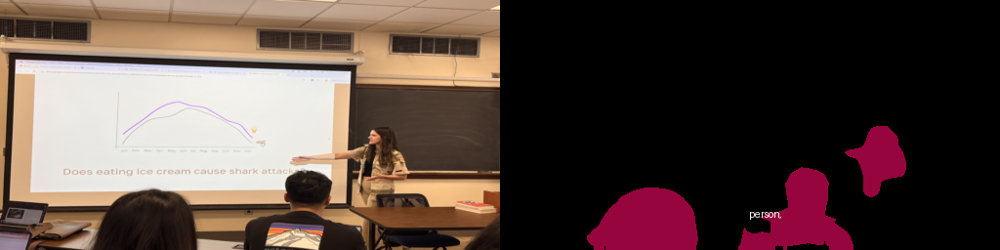

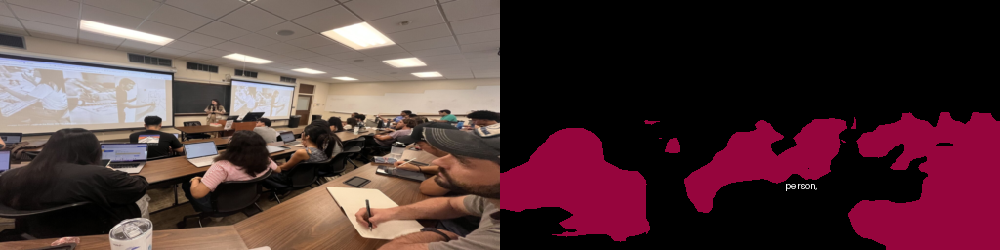

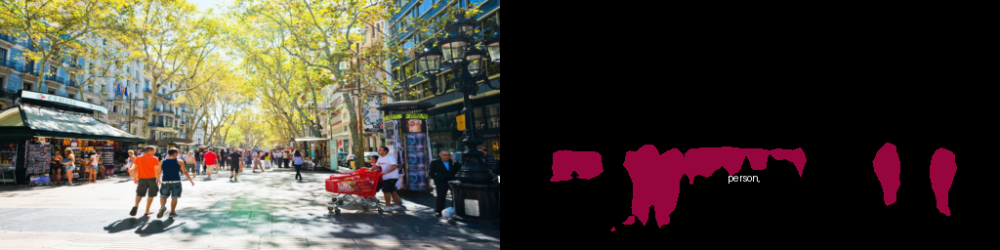

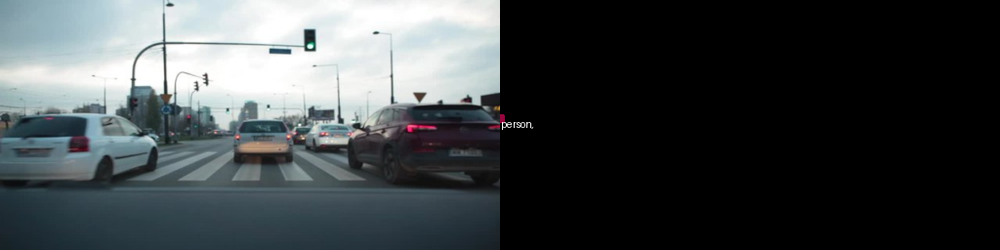

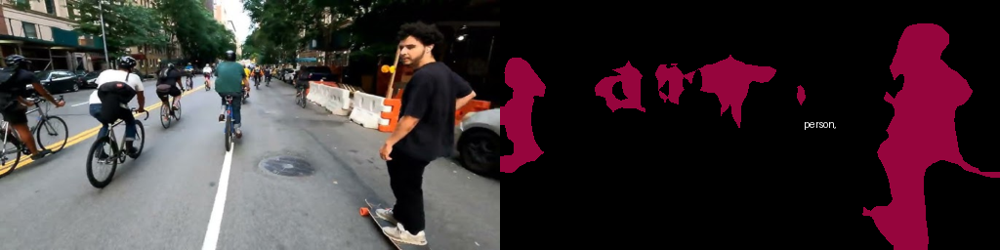

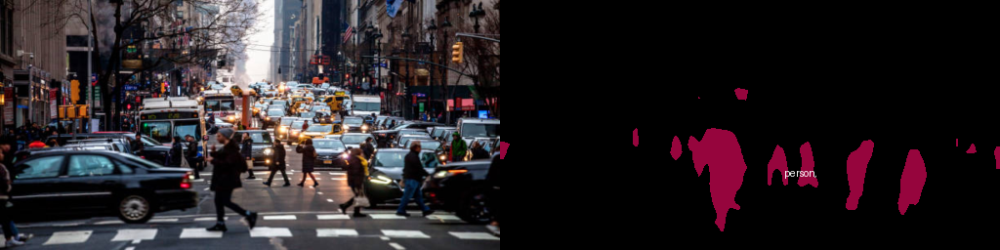

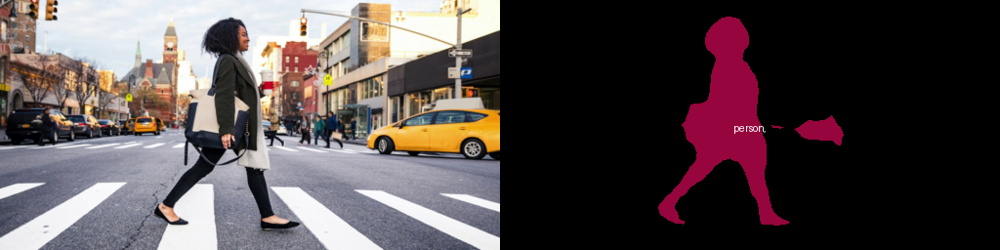

In [26]:
# Top classes in answer
# Example: filter only "people" (index 13)
target_class = 13

for url in url_collections:
  response = requests.get(url, timeout=10)
  response.raise_for_status()  # ensures request was successful

  pil_image = Image.open(BytesIO(response.content)).convert('RGB')
  pil_image = pil_image.resize((512,256), resample=Image.BILINEAR)

  # pil_image = PIL.Image.open().convert('RGB')
  img_original = numpy.array(pil_image)
  img_data = pil_to_tensor(pil_image)
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]
  # Run the segmentation at the highest resolution.
  with torch.no_grad():
      scores = segmentation_module(singleton_batch, segSize=output_size)

  # Get the predicted scores for each pixel
  _, pred = torch.max(scores, dim=1)
  # Convert to CPU numpy array
  pred = pred.cpu()[0].numpy()
  # visualize only the "people" mask
  visualize_result(img_original, pred, index=12, class_map=class_map)
  del singleton_batch, scores, img_data
  torch.cuda.empty_cache()   # release cached memory
  gc.collect()



### GradCam inference and analysis

100%|██████████| 64/64 [00:56<00:00,  1.14it/s]


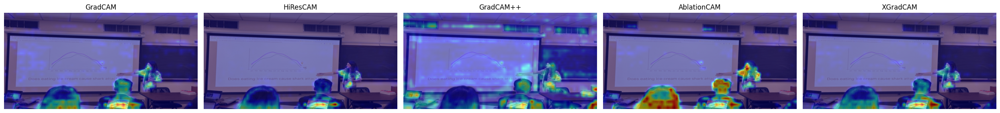

100%|██████████| 64/64 [00:55<00:00,  1.16it/s]


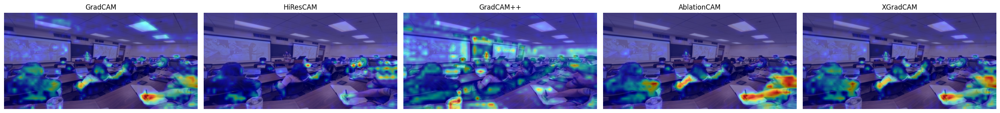

100%|██████████| 64/64 [00:54<00:00,  1.17it/s]


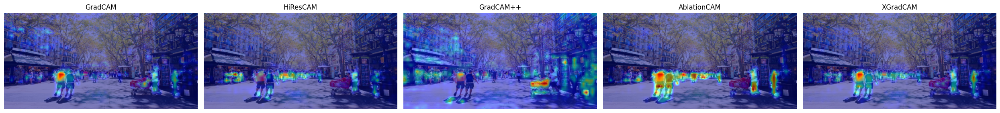

100%|██████████| 64/64 [00:54<00:00,  1.17it/s]


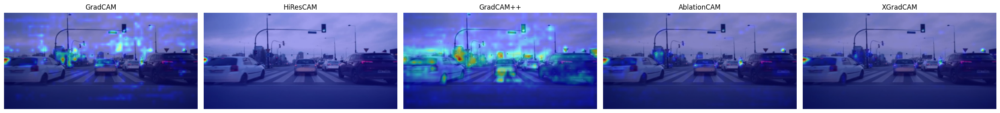

100%|██████████| 64/64 [00:54<00:00,  1.16it/s]


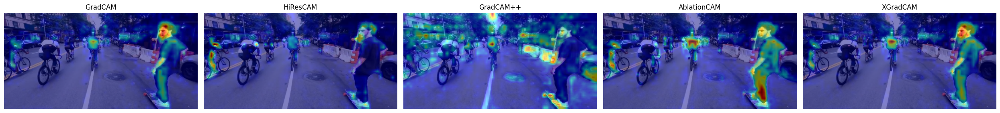

100%|██████████| 64/64 [00:54<00:00,  1.17it/s]


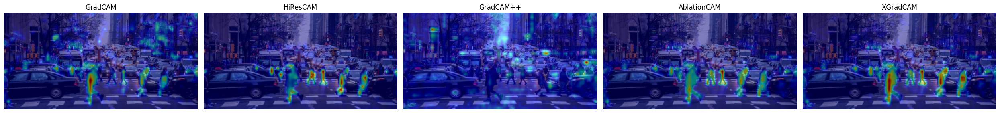

100%|██████████| 64/64 [00:54<00:00,  1.16it/s]


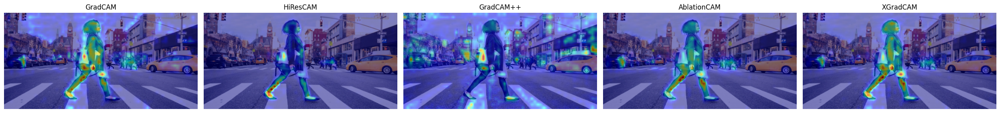

In [27]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad

from PIL import Image
import matplotlib.pyplot as plt

# Define Grad-CAM target class once
class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = torch.from_numpy(mask).float().cuda()

    def __call__(self, model_output):
        # Ensure batch dimension
        if model_output.dim() == 3:  # [C,H,W]
            model_output = model_output.unsqueeze(0)  # [1,C,H,W]
        return (model_output[:, self.category, :, :] * self.mask).sum()


class SegModuleWrapper(torch.nn.Module):
    def __init__(self, seg_module):
        super().__init__()
        self.seg_module = seg_module

    def forward(self, x):
        # x: [B,3,H,W]
        # SegmentationModule expects {'img_data': x}
        out = self.seg_module({'img_data': x}, segSize=x.shape[2:])
        # out has shape [B,C,H,W]
        return out


wrapped_model = SegModuleWrapper(segmentation_module)


target_class = 13 - 1  # 0-based index for "person"

from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import torch
import numpy as np

# Grad-CAM variants dictionary
cam_methods = {
    'GradCAM': GradCAM,
    'HiResCAM': HiResCAM,
    # 'ScoreCAM': ScoreCAM,
    'GradCAM++': GradCAMPlusPlus,
    'AblationCAM': AblationCAM,
    'XGradCAM': XGradCAM,
    # 'EigenCAM': EigenCAM,
    # 'FullGrad': FullGrads
}

# Loop over images
for url in url_collections:
    response = requests.get(url, timeout=10)
    response.raise_for_status()
    pil_image = Image.open(BytesIO(response.content)).convert('RGB')
    pil_image = pil_image.resize((512,256), resample=Image.BILINEAR)

    img_original = np.array(pil_image)
    img_data = pil_to_tensor(pil_image)[None].cuda()  # [1,3,H,W]

    # Forward pass for segmentation
    with torch.no_grad():
        scores = segmentation_module({'img_data': img_data}, segSize=img_data.shape[2:])
    _, pred = torch.max(scores, dim=1)
    pred_np = pred.cpu()[0].numpy()

    # Binary mask for target class
    mask_float = (pred_np == target_class).astype(np.float32)
    targets = [SemanticSegmentationTarget(target_class, mask_float)]
    target_layers = [net_encoder.layer4]

    # Prepare subplots
    n_cams = len(cam_methods)
    fig, axes = plt.subplots(1, n_cams, figsize=(5*n_cams,5))

    for ax, (cam_name, cam_class) in zip(axes, cam_methods.items()):
        # Use context manager to ensure proper cleanup
        with cam_class(model=wrapped_model, target_layers=target_layers) as cam:
            grayscale_cam = cam(img_data, targets)[0]  # [H_out, W_out]

        # Resize to original image size
        grayscale_cam_resized = cv2.resize(grayscale_cam, (img_original.shape[1], img_original.shape[0]))
        cam_image = show_cam_on_image(np.float32(img_original)/255.0, grayscale_cam_resized, use_rgb=True)

        # Display
        ax.imshow(cam_image)
        ax.axis('off')
        ax.set_title(cam_name)

        del grayscale_cam, grayscale_cam_resized, cam_image
    plt.tight_layout()
    plt.show()
    del scores, img_data, targets, img_original,pred_np,pred
    torch.cuda.empty_cache()   # release cached memory
    gc.collect()


# Comparison and contrast of attention maps generated by GradCAM and its variants.


Using the different variations of Grad-Cam we can clearly see that GradCAM hints the visual cues used by the model applying contrast such as the face of the people in the image, or the shape of the people present in the image. On the other hand HiResCam helps us better identifying when there are a lot of elements as shown in the second to last image, where the underlying model uses purely the figure of the human body to differentiate cars and other elements from humans.

On the other hand GradCam++ takes an interesting approach ot trying to contrast other elements to affirm the existing of the analyzed class. AblaitionCAM, given its usage of gradient calculation is the best overall at identifying focus points the model uses to identify shapes specifically trying to contrast the human figure. Finally XGradCam takes a highly sensitive approach to highlight that the model could be using hands, faces, legs or other elements to identify the pixels in which the model predicts the mask for contrast.

# Reflection:


### visual cues the model attends to

Across the different variations of GradCam the main elements for people are the face, hands, feet or the shape of a human (bipedal). This leads me to believe that the model might confuse other elements that resemble the shape of a human being (bipedal, standing up)

### Comment on any surprising or misleading behavior

GradCam++ seems to try to show the contrast of the surrounding area to identify the human shape, this could be very misleading and there seems to be very high variability across the scenes.

### Reflect on why model explainability is important in your selected application domain

I would like to work on projects for autonomous driving. This special use case is heavily tailored to identify people to avoid cars running over pedestrians. I think is very valuable as it shows that the model is quite effective identifying the correct criteria for attention even when there are multiple elements in a crowded image.

# Appendix - Other experiments

## Object detection

In [28]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
import cv2
import numpy as np
import torch
import torchvision
from pytorch_grad_cam import AblationCAM, EigenCAM
from pytorch_grad_cam.ablation_layer import AblationLayerFasterRCNN
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_accross_batch_and_channels, scale_cam_image

def predict(input_tensor, model, device, detection_threshold):
    outputs = model(input_tensor)
    pred_classes = [coco_names[i] for i in outputs[0]['labels'].cpu().numpy()]
    pred_labels = outputs[0]['labels'].cpu().numpy()
    pred_scores = outputs[0]['scores'].detach().cpu().numpy()
    pred_bboxes = outputs[0]['boxes'].detach().cpu().numpy()

    boxes, classes, labels, indices = [], [], [], []
    for index in range(len(pred_scores)):
        if pred_scores[index] >= detection_threshold:
            boxes.append(pred_bboxes[index].astype(np.int32))
            classes.append(pred_classes[index])
            labels.append(pred_labels[index])
            indices.append(index)
    boxes = np.int32(boxes)
    return boxes, classes, labels, indices

def draw_boxes(boxes, labels, classes, image):
    for i, box in enumerate(boxes):
        color = COLORS[labels[i]]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[1] - 5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2,
                    lineType=cv2.LINE_AA)
    return image

coco_names = ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', \
              'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
              'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
              'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella',
              'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
              'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
              'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork',
              'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
              'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
              'potted plant', 'bed', 'N/A', 'dining table', 'N/A', 'N/A', 'toilet',
              'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
              'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase',
              'scissors', 'teddy bear', 'hair drier', 'toothbrush']


# This will help us create a different color for each class
COLORS = np.random.uniform(0, 255, size=(len(coco_names), 3))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 189MB/s]


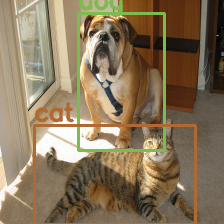

In [29]:
import requests
import torchvision
from PIL import Image
image_url = "https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/both.png"
image = np.array(Image.open(requests.get(image_url, stream=True).raw))
image_float_np = np.float32(image) / 255
# define the torchvision image transforms
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])

input_tensor = transform(image)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_tensor = input_tensor.to(device)
# Add a batch dimension:
input_tensor = input_tensor.unsqueeze(0)

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval().to(device)

# Run the model and display the detections
boxes, classes, labels, indices = predict(input_tensor, model, device, 0.9)
image = draw_boxes(boxes, labels, classes, image)

# Show the image:
Image.fromarray(image)

In [30]:
def fasterrcnn_reshape_transform(x):
    target_size = x['pool'].size()[-2 : ]
    activations = []
    for key, value in x.items():
        activations.append(torch.nn.functional.interpolate(torch.abs(value), target_size, mode='bilinear'))
    activations = torch.cat(activations, axis=1)
    return activations

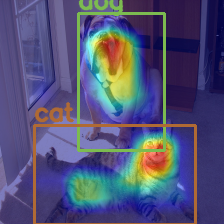

In [31]:
class FasterRCNNBoxScoreTarget:

  def __init__(self, labels, bounding_boxes, iou_threshold=0.5):
      self.labels = labels
      self.bounding_boxes = bounding_boxes
      self.iou_threshold = iou_threshold

  def __call__(self, model_outputs):
      output = torch.Tensor([0])
      if torch.cuda.is_available():
          output = output.cuda()

      if len(model_outputs["boxes"]) == 0:
          return output

      for box, label in zip(self.bounding_boxes, self.labels):
          box = torch.Tensor(box[None, :])
          if torch.cuda.is_available():
              box = box.cuda()

          ious = torchvision.ops.box_iou(box, model_outputs["boxes"])
          index = ious.argmax()
          if ious[0, index] > self.iou_threshold and model_outputs["labels"][index] == label:
              score = ious[0, index] + model_outputs["scores"][index]
              output = output + score
      return output

target_layers = [model.backbone]
targets = [FasterRCNNBoxScoreTarget(labels=labels, bounding_boxes=boxes)]
cam = EigenCAM(model,
               target_layers,
               #use_cuda=torch.cuda.is_available(),
               reshape_transform=fasterrcnn_reshape_transform)

grayscale_cam = cam(input_tensor, targets=targets)
# Take the first image in the batch:
grayscale_cam = grayscale_cam[0, :]
cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)
# And lets draw the boxes again:
image_with_bounding_boxes = draw_boxes(boxes, labels, classes, cam_image)
Image.fromarray(image_with_bounding_boxes)